# 🐶 End-to end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1.Problem

Identifying the breed of the dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of the dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with the images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are 10,000+ images in the training set (these images have labels)
* There are 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
# Unzip the uploaded data in the google drive
#!unzip "drive/MyDrive/Dog-Breed/dog-breed-identification.zip" -d "drive/MyDrive/Dog-Breed/"

### Get our Workspace Ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import TensorFlow into Colab
# Tensors are multi dimensional arrays of data (eg.images)
import tensorflow as tf
print("TF version:", tf.__version__)


TF version: 2.12.0


In [ ]:
# Import necessary tools
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)


TF Hub version: 0.14.0


In [ ]:
# Check for GPU availability
print("GPU", "available (Yessss!!!!!!)" if tf.config.list_physical_devices("GPU") else "not avialable :(")

GPU available (Yessss!!!!!!)


## Getting our Data Ready (turning into Tensors)

With all Machine Learning Models, our dara has to be in numerical format. so that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog-Breed/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images there are of each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

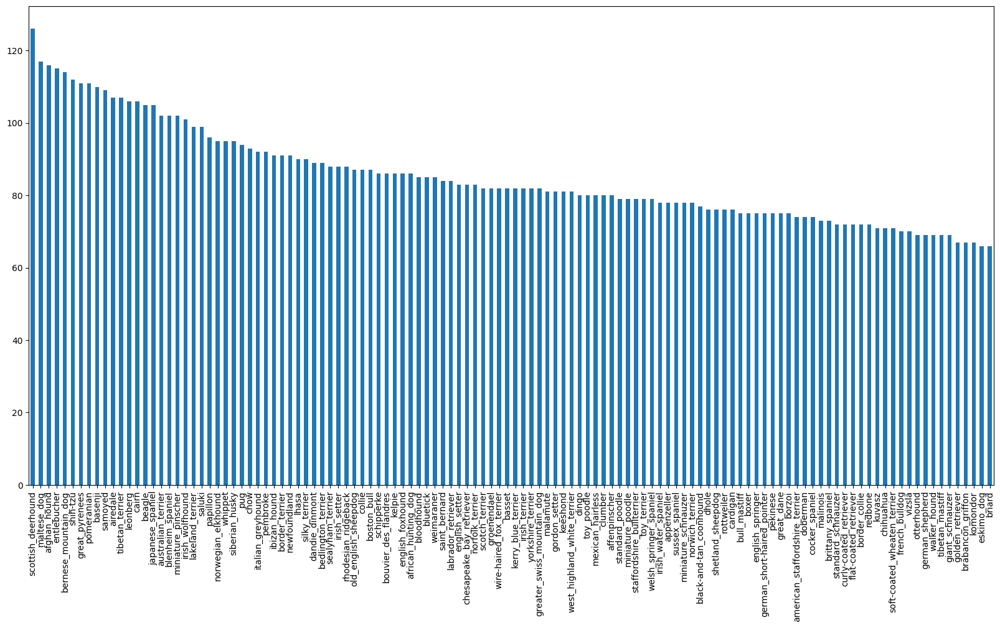

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

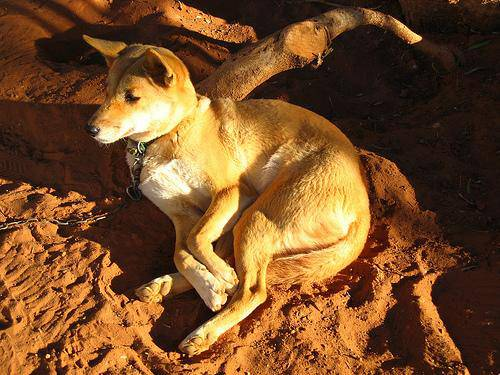

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog-Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog-Breed/train/" + fname  + ".jpg" for fname in labels_csv["id"]]

# Check the first 10 filenames
filenames[:10]

['drive/MyDrive/Dog-Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Breed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Breed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Breed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Breed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Breed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Checking the length of filenames
len(filenames)

10222

In [ ]:
# Checking the length of actual images file
len(labels_csv)

10222

In [ ]:
# Checking whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog-Breed/train/")) == len(filenames):
  print("Filenames match the actual amount of files!!! Proceed.")
else:
  print("Filenames do not match the actual amount of files, check the target directory.")

Filenames match the actual amount of files!!! Proceed.


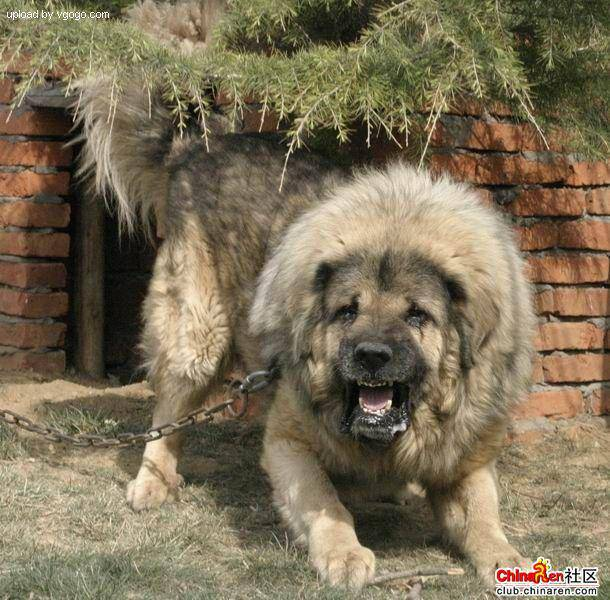

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of Labels matches the number of filenames!!!!! Proceed")
else:
  print("Number of Labels does not matches the number of filenames, check the data directories.")

Number of Labels matches the number of filenames!!!!! Proceed


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(labels)

10222

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[4])
print(boolean_labels[4].astype(int))

golden_retriever
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:5]

['drive/MyDrive/Dog-Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

### Creating our own validation set

Since the dataset from Kaggle doesn't come with the validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
len(boolean_labels)

10222

We're going to start off experimenting with ~1000 images and then increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 2000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into two different sets (training and validation sets) of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(1600, 1600, 400, 400)

In [ ]:
len(X_train)

1600

In [ ]:
# Let's have a look at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog-Breed/train/17c5e8815cf0d086090a07b003b9b036.jpg',
  'drive/MyDrive/Dog-Breed/train/0593e37870ee77b0d34508e118bf6670.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
          True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take the image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalise our image (convert colour channel values from 0-255 to 0-1).
5. Resize the 'image' to be a shape of (224, 224)
6. Return the modified 'image'

In [ ]:
# Convert an image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
# Turn image into Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define the size of image
IMG_SIZE = 224

# Create a fuction to preprocess the image
def process_image(image_path):
  """
  Takes an image filepath and turns it into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor, channels=3)

In [ ]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## Turning our data into Batches

Batch is a small portion our data.
Default Batch size = 32

Why turn our data into batches?
If we are trying to process 10,000+ images in one go...they all might not fit into memory.

So, that's why we do about 32 (batch size) images at a time (batch size can be adjusted)

Inorder to use TensorFlow effectively, we need our data in the form of Tensor Tuples which look like this:
'(image, label)'

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
 """
 Take an image file path name and the associated label, process the image and
 returns a tuple of (image,label).
 """
 image = process_image(image_path)
 return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[ 83.236534  , 133.1836    ,  82.436806  ],
         [ 64.697754  , 113.13456   ,  61.50028   ],
         [ 65.534386  , 113.91071   ,  60.929058  ],
         ...,
         [ 74.779015  , 132.34285   ,  81.996445  ],
         [ 75.79053   , 133.79053   ,  84.22733   ],
         [ 75.186874  , 133.18687   ,  85.186874  ]],
 
        [[ 66.05301   , 115.71407   ,  69.60177   ],
         [ 62.157993  , 112.378975  ,  65.146835  ],
         [ 72.39411   , 120.39411   ,  72.16197   ],
         ...,
         [ 71.0263    , 128.21379   ,  79.06201   ],
         [ 72.4933    , 130.27232   ,  82.935265  ],
         [ 73.49589   , 131.2749    ,  83.93785   ]],
 
        [[ 53.40004   , 103.76702   ,  65.770996  ],
         [ 61.31571   , 111.9474    ,  73.15723   ],
         [ 73.95284   , 122.240585  ,  82.23173   ],
         ...,
         [ 66.48884   , 123.45766   ,  76.8192    ],
         [ 69.10889   , 126.10889   ,  81.8455  

Now we've got a way to turn our data into tuple tensors in the form : '(image, label)', let's make a function to turn all our data (X & y) into batches.

In [ ]:
# Define the Batch size, 32 is a good start
BATCH_SIZE = 32

# Create a functon to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label(y) pairs.
  Shuffles the data if its training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches.......")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image_processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches....
Creating validation data batches.......


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!!

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 images for displaying them
  for i in range(25):
    # Create subplots(5 rows and 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i].astype('uint8'))
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
filenames

['drive/MyDrive/Dog-Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Breed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Breed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Breed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Breed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Breed/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog-Breed/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog-Breed/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog-Breed/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog-Breed/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 'driv

In [ ]:
# Check this out
# data = tf.image.convert_image_dtype(filenames[0], tf.float32)
# plt.imshow(data, cmap='gray')
# plt.show()

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[ 46.630817 ,  19.63082  ,   8.630819 ],
          [ 50.05397  ,  23.05397  ,  12.05397  ],
          [ 45.415337 ,  21.576054 ,   9.495695 ],
          ...,
          [120.12698  , 132.58035  , 134.0959   ],
          [120.874596 , 130.8746   , 130.76825  ],
          [119.562485 , 129.56248  , 128.56248  ]],
 
         [[ 44.38353  ,  17.38353  ,   6.3835297],
          [ 44.36073  ,  17.360731 ,   6.3607297],
          [ 40.163666 ,  16.32438  ,   4.2440233],
          ...,
          [124.90379  , 134.09822  , 135.4167   ],
          [123.18631  , 132.67857  , 131.67857  ],
          [124.77638  , 133.00081  , 132.25934  ]],
 
         [[ 52.330357 ,  25.330357 ,  14.330357 ],
          [ 50.1875   ,  23.1875   ,  12.187499 ],
          [ 52.322468 ,  28.483181 ,  16.402822 ],
          ...,
          [132.23479  , 137.53206  , 136.97586  ],
          [135.66966  , 140.93752  , 141.30359  ],
          [141.03111  , 145.5179   , 146.2745   ]],
 
         ...,
 
         [[1

In [ ]:
len(train_images), len(train_labels)

(32, 32)

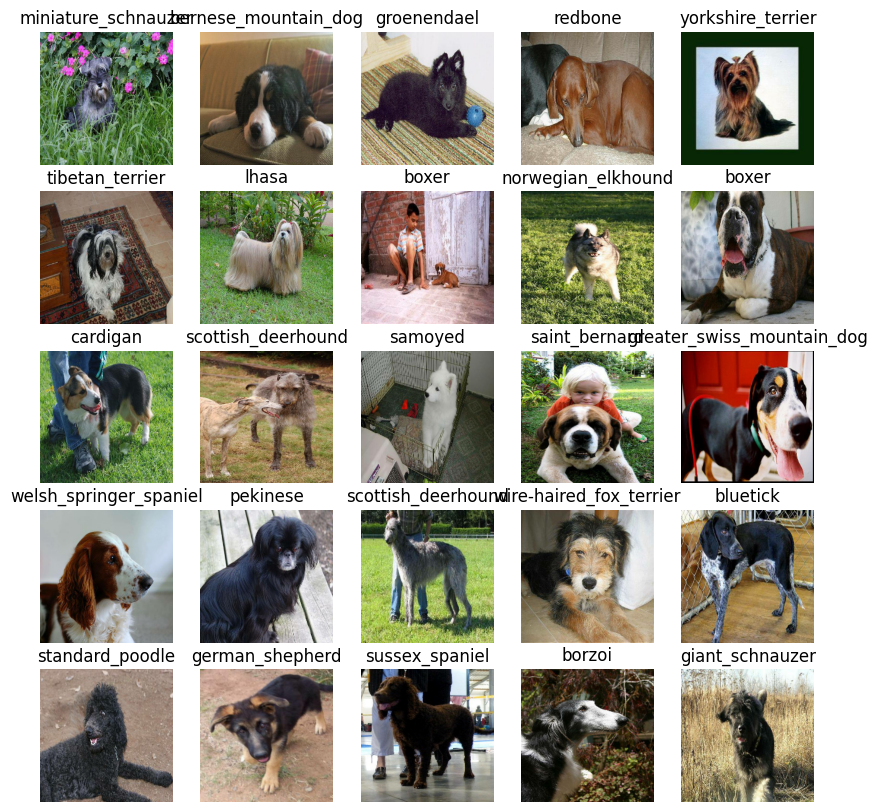

In [ ]:
# Now let's visualize the data in a training batch
#train_images, train_labels = next(train_data.as_numpy_iterator())
# Now each time we'll run this cell it is going to shuffle our data and output will be different images
show_25_images(train_images, train_labels)

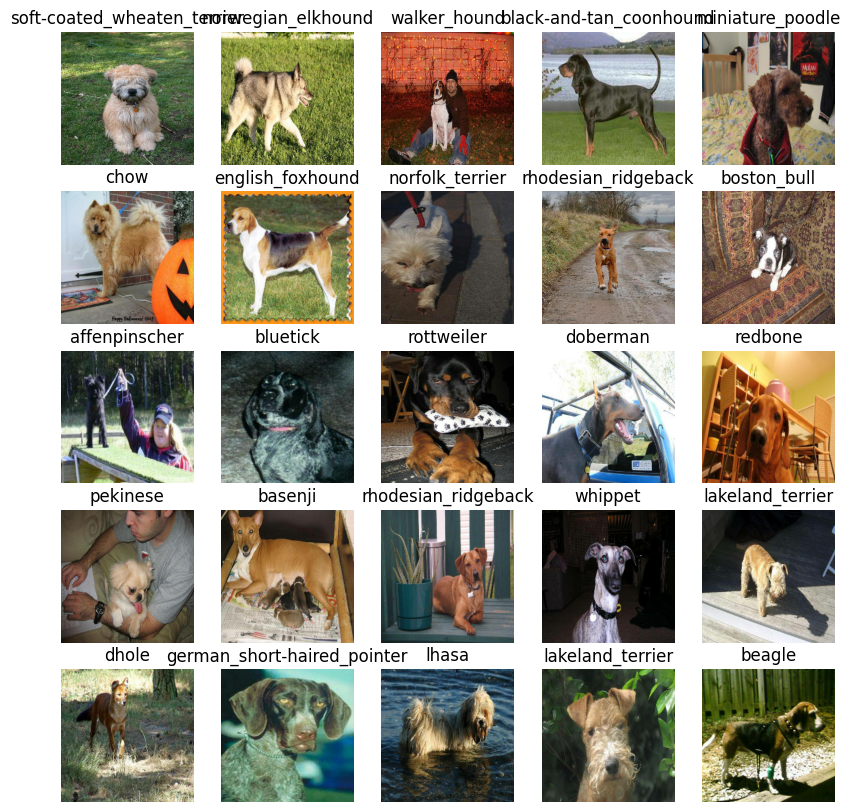

In [ ]:
# Now let's visualize our validation dataset
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels in the form of Tensors)of our model
* The URL of the model we want to use from tensorflow hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4.

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup the URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go.Let's put them together into a Keras deep learning model!!

Knowing this, let's create a function which:


*  Takes the input shape, output shape and the model we've chosen as parameters.
*   Defines the layers in Keras model in a sequential fashion (do this first, then this, then that).
*   Compiles the model (says it should be evaluated and improved)
*   Builds the model (tells the model the input shape it'll be getting).
*   Returns the model

All these steps can be found here: https://www.tensorflow.org/guide/keras#models








In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with", MODEL_URL)

  # Setup the model layers (Instantiate the model)
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # layer1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, # Since we don't want the shape of moblienetv2, we want our own shape of output so we have defined it)
                            activation="softmax") # layer2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

**Callbacks** are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if the model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callbacks

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✔
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function.


**link for documentation** : https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog-Breed/logs",
                        # Make it so that the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early Stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a Model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

Number of epochs = How many passes of the data we'd like our model to do to find out the patterns.

Pass = model trying to find patterns in each dog image and see which patterns relate to each label.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:100, max:1000, step:100}

In [ ]:
# Check to make sure we are still running on a GPU
print("GPU ", "available (YESSSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU  available (YESSSS!!!!!!)


Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping]) # can also add early_stopping

  # Retrun the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
50/50 [==============================] - 932s 19s/step - loss: 5.7656 - accuracy: 0.0056 - val_loss: 5.1218 - val_accuracy: 0.0125
Epoch 2/100
50/50 [==============================] - 82s 2s/step - loss: 4.4648 - accuracy: 0.0606 - val_loss: 5.1000 - val_accuracy: 0.0125
Epoch 3/100
50/50 [==============================] - 76s 2s/step - loss: 3.9553 - accuracy: 0.1300 - val_loss: 5.0745 - val_accuracy: 0.0275
Epoch 4/100
50/50 [==============================] - 82s 2s/step - loss: 3.5833 - accuracy: 0.1831 - val_loss: 5.1751 - val_accuracy: 0.0175
Epoch 5/100
50/50 [==============================] - 84s 2s/step - loss: 3.2388 - accuracy: 0.2631 - val_loss: 5.1730 - val_accuracy: 0.0175
Epoch 6/100
50/50 [==============================] - 95s 2s/step - loss: 2.9420 - accuracy: 0.3100 - val_loss: 5.2294 - val_accuracy: 0.0400
Epoch 7/100
50/50 [==============================] - 85s 2s/

Here, the model is overfitting. Since the model is performing better on the training data rather than on validation dataset....It is like our model has memorized the training data....

### Checking the TensorBoard logs

The TensorBoard magic funtion (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog-Breed/logs

Launching TensorBoard...

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions
# Verbose shows the progress

13/13 [==============================] - 25s 2s/step


array([[1.2793308e-03, 1.7690032e-03, 4.3702216e-04, ..., 2.6531756e-04,
        3.6883350e-03, 2.4960638e-04],
       [1.0822995e-03, 1.8938819e-03, 4.9552677e-04, ..., 4.0312210e-04,
        2.9315255e-04, 8.8248271e-05],
       [2.8576595e-03, 6.4999727e-03, 5.4203928e-04, ..., 3.9997914e-05,
        3.4557886e-03, 3.7407468e-04],
       ...,
       [2.8785926e-03, 4.8787491e-03, 1.7001602e-04, ..., 2.7497113e-05,
        8.9474563e-03, 1.0381024e-03],
       [5.3158808e-03, 6.7708576e-03, 4.3832560e-04, ..., 1.2452960e-04,
        3.1253900e-02, 1.9754632e-03],
       [1.7649232e-03, 4.1831424e-03, 9.2266715e-04, ..., 6.5296370e-04,
        1.4917608e-03, 6.4908608e-04]], dtype=float32)

In [ ]:
predictions.shape

(400, 120)

In [ ]:
len(y_val)

In [ ]:
len(unique_breeds)

In [ ]:
len(predictions[0])

120

In [ ]:
predictions[0]
# Here predictions[0] is determining the probability of our image on comaring to different labels i.e higher the probability most likely the label of the image

array([3.68226483e-03, 1.91840474e-02, 8.02208495e-04, 6.10143365e-03,
       2.11538537e-03, 9.39149689e-03, 1.77701563e-02, 5.97367389e-03,
       1.44293794e-04, 9.20865205e-05, 3.46605629e-02, 1.31553458e-02,
       1.81281043e-03, 5.99727209e-05, 6.35648239e-03, 5.39966039e-02,
       2.09457669e-02, 9.01447551e-04, 6.27939254e-02, 7.57903978e-03,
       4.47925441e-02, 1.44807578e-04, 2.23498908e-03, 4.49010258e-04,
       3.30571289e-04, 1.74383007e-04, 4.29576039e-02, 4.57158964e-03,
       7.04699615e-03, 4.90961131e-04, 1.99012947e-03, 9.68976936e-04,
       3.40343744e-04, 5.90909796e-04, 2.49134959e-03, 8.28651618e-03,
       8.98123346e-03, 2.04531997e-02, 1.02088915e-03, 2.27845358e-05,
       2.05781730e-03, 1.00567391e-04, 7.13509843e-02, 6.43797778e-03,
       3.05780536e-03, 2.27027922e-03, 6.20220322e-03, 1.53487641e-02,
       2.48573907e-03, 1.15690827e-05, 9.58798081e-03, 5.50878607e-03,
       3.92280426e-03, 3.05993191e-04, 1.11843497e-02, 8.15007312e-04,
      

In [ ]:
predictions[0].argmax()

80

In [ ]:
predictions[0][88]

0.0022976492

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")

[1.20803576e-04 1.44854974e-04 6.63441824e-05 2.02683921e-04
 6.62447303e-04 2.22273287e-03 6.20900100e-05 9.46756511e-04
 8.95077712e-04 1.81230009e-01 3.97085132e-05 1.29510721e-04
 1.72522850e-03 8.14659361e-05 3.69709693e-02 2.11949271e-04
 3.59878613e-05 1.07981657e-04 1.55668822e-03 1.06594453e-04
 1.27918265e-05 2.44204774e-02 2.03285657e-04 1.43858606e-05
 4.68971324e-04 3.73014897e-01 1.94431032e-05 4.02208272e-04
 3.98740452e-03 5.66084590e-03 6.90251327e-05 3.11224081e-04
 5.71297824e-05 1.33066114e-05 5.75284066e-05 5.94880075e-05
 1.62194611e-03 1.68610120e-03 2.15969281e-04 2.89487652e-03
 4.72373940e-05 1.88185382e-04 2.26699267e-04 1.45523198e-04
 2.21317205e-05 6.43704785e-03 1.31827128e-05 1.48880668e-03
 1.20858371e-03 7.05130107e-04 3.73902913e-06 1.18521719e-04
 2.43650889e-03 4.52503300e-04 4.18387572e-05 9.18294128e-04
 2.88626854e-03 1.36948322e-04 5.56770319e-05 3.00153653e-04
 8.37139523e-05 3.01708560e-03 1.51908887e-03 1.18414056e-03
 7.34662581e-06 1.238897

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note : Prediction probabilities are also called confidence levels.**

In [ ]:
# Turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[8])
pred_label

'black-and-tan_coonhound'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
images_ = []
labels_ = []

# Loop through unbatch data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(unique_breeds[np.argmax(label)])

images_[0], labels_[0]

(array([[[ 73.79941  ,  84.79941  ,  44.799408 ],
         [ 63.78653  ,  74.79341  ,  34.793407 ],
         [ 73.342255 ,  85.22143  ,  45.221424 ],
         ...,
         [131.68724  , 147.30331  ,  86.45509  ],
         [139.67363  , 155.2897   ,  94.44149  ],
         [127.90648  , 143.52255  ,  82.67433  ]],
 
        [[ 70.55293  ,  83.55293  ,  40.552933 ],
         [ 78.98722  ,  92.00616  ,  49.006157 ],
         [ 86.592354 , 101.28878  ,  58.28878  ],
         ...,
         [125.334785 , 142.183    ,  72.941925 ],
         [145.40985  , 162.25806  ,  93.01699  ],
         [135.5033   , 152.35152  ,  83.11044  ]],
 
        [[ 74.12815  ,  90.57265  ,  45.54556  ],
         [ 76.00933  ,  92.101746 ,  47.10085  ],
         [ 79.06999  ,  96.23071  ,  51.150352 ],
         ...,
         [127.64089  , 144.56053  ,  74.04269  ],
         [142.13278  , 159.05241  ,  88.53457  ],
         [140.6773   , 157.59695  ,  87.079094 ]],
 
        ...,
 
        [[ 62.407463 ,  71.18811  

In [ ]:
get_pred_label(labels_[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'norwegian_elkhound'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(batch_set):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of the images and labels.
  """

  images = []
  labels = []

  # Loop through unbatch data
  for image, label in batch_set.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation dataset
val_images, val_label = unbatchify(val_data)
#val_images[0], val_label[0]
len(val_label)

400

In [ ]:
val_label[42]

'saluki'

In [ ]:
get_pred_label(val_label[0])

'affenpinscher'

Now we've got ways to get:

*   Prediction labels
*   Validation labels (truth labels)
*   Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted proability, the truth label and the target images on the single plot.





In [ ]:
len(train_data)

50

In [ ]:
len(val_data)

13

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Plot the image and remove the ticks
  plt.imshow(image.astype('uint8'))
  plt.yticks([])
  plt.xticks([])

  # Change the colour of the title on if the prediction is write or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

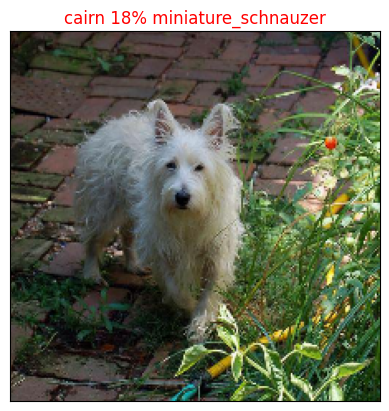

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_label,
          images=val_images,
          n=45)


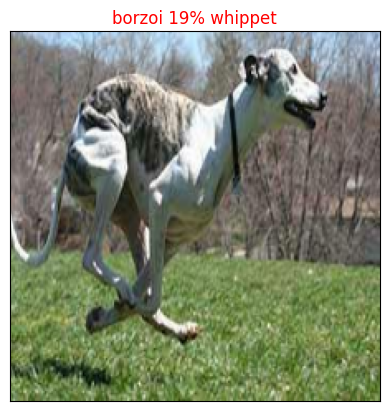

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_label,
          images=val_images,
          n=63)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10 ( Accuracy of model if we include top 10 predictions):
  * prediction probabilities indexes
  * prediction probabilities values
  * prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
predictions[0]

array([3.68226483e-03, 1.91840474e-02, 8.02208495e-04, 6.10143365e-03,
       2.11538537e-03, 9.39149689e-03, 1.77701563e-02, 5.97367389e-03,
       1.44293794e-04, 9.20865205e-05, 3.46605629e-02, 1.31553458e-02,
       1.81281043e-03, 5.99727209e-05, 6.35648239e-03, 5.39966039e-02,
       2.09457669e-02, 9.01447551e-04, 6.27939254e-02, 7.57903978e-03,
       4.47925441e-02, 1.44807578e-04, 2.23498908e-03, 4.49010258e-04,
       3.30571289e-04, 1.74383007e-04, 4.29576039e-02, 4.57158964e-03,
       7.04699615e-03, 4.90961131e-04, 1.99012947e-03, 9.68976936e-04,
       3.40343744e-04, 5.90909796e-04, 2.49134959e-03, 8.28651618e-03,
       8.98123346e-03, 2.04531997e-02, 1.02088915e-03, 2.27845358e-05,
       2.05781730e-03, 1.00567391e-04, 7.13509843e-02, 6.43797778e-03,
       3.05780536e-03, 2.27027922e-03, 6.20220322e-03, 1.53487641e-02,
       2.48573907e-03, 1.15690827e-05, 9.58798081e-03, 5.50878607e-03,
       3.92280426e-03, 3.05993191e-04, 1.11843497e-02, 8.15007312e-04,
      

In [ ]:
# Returns the index of sorted array
predictions[0].argsort()

array([ 49,  39,  99,  13,   9, 107,  41, 112,  92,  79,   8,  21,  25,
       103,  57,  74,  53,  24,  32,  98,  23,  61, 108, 104,  29,  66,
        33,  58,  64,   2,  55,  87,  17,  69,  73,  31, 115,  38,  89,
       111,  81, 100, 114, 102,  78,  12,  30,  83,  40,   4,  72,  22,
        45,  88,  94,  48,  34,  77,  60,  44,  95,  70,  56,  90,   0,
        75,  96,  68,  52,  85, 113,  27,  65, 117,  51,   7,   3,  67,
        46, 119,  14, 101,  43,  91,  28,  93,  86,  63,  19,  62,  35,
        84,  59,  36,   5,  50, 109,  82,  54, 116,  11,  76,  71, 110,
        47,   6,   1, 118,  37,  16,  97,  10, 105, 106,  26,  20,  15,
        18,  42,  80])

In [ ]:
# Top 10 predictions in descending order
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.09407276, 0.07135098, 0.06279393, 0.0539966 , 0.04479254,
       0.0429576 , 0.03632659, 0.03504335, 0.03466056, 0.03230256],
      dtype=float32)

In [ ]:
predictions[0].max()

0.09407276

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['norwegian_elkhound', 'entlebucher', 'borzoi', 'bluetick',
       'bouvier_des_flandres', 'cairn', 'standard_schnauzer',
       'standard_poodle', 'bedlington_terrier', 'scottish_deerhound'],
      dtype=object)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest predictions confidence levels along with the truth label for sample n.
  """
  pred_prob, true_labels = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidenes values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup a plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true_label
  if np.isin(true_labels, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_labels)].set_color("green")
  else:
    pass

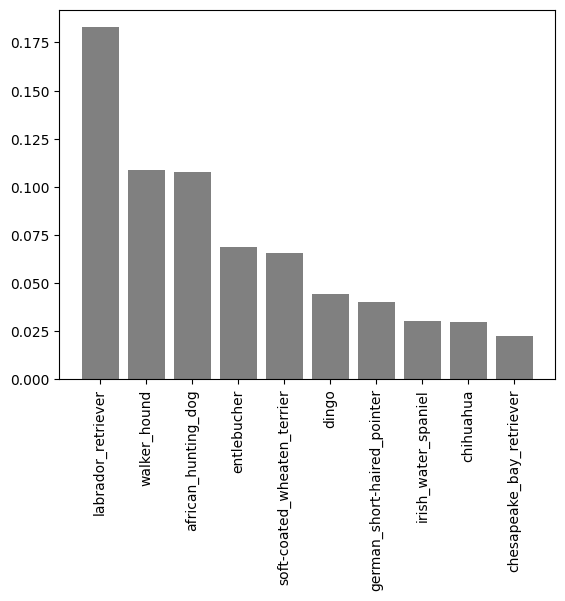

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_label,
               n=9)

Now we've got some functions to visualise our predictions and evaluate our model, let's check it out!!

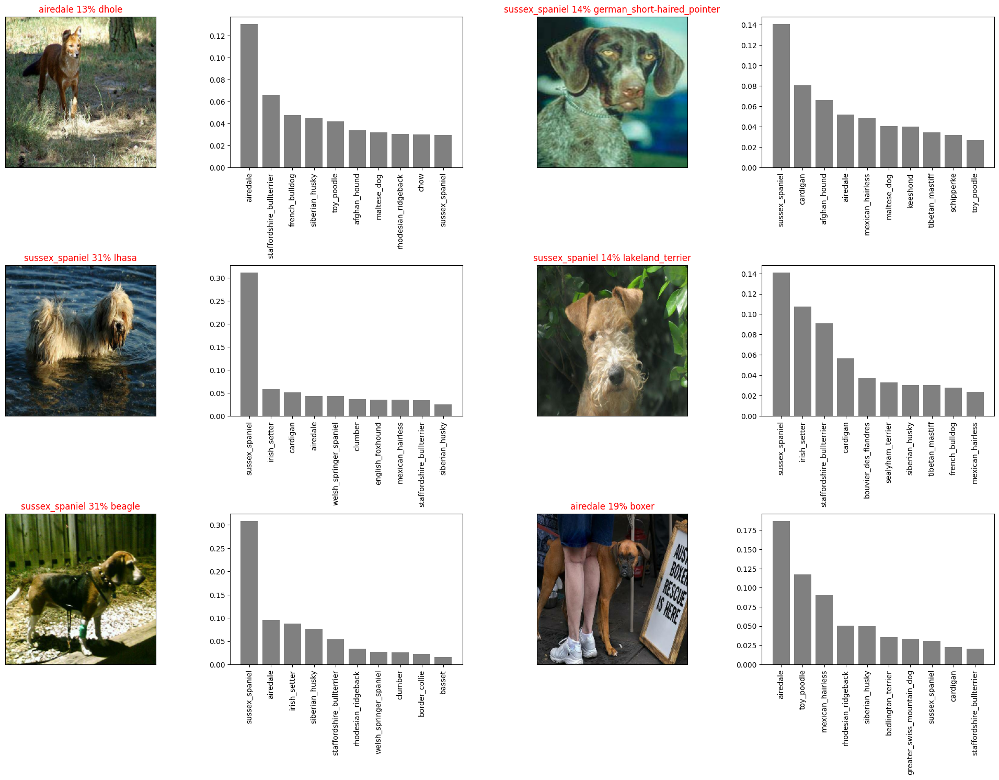

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_label,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_label,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model's directory and appends a suffix string
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog-Breed/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 2000 images
save_model(model, suffix="2000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog-Breed/models/20230811-13311691760661-2000-images-mobilenetv2-Adam.h5....


'drive/My Drive/Dog-Breed/models/20230811-13311691760661-2000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_2000_image_model = load_model("drive/My Drive/Dog-Breed/models/20230811-13311691760661-2000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog-Breed/models/20230811-13311691760661-2000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre- saved model
model.evaluate(val_data)

13/13 [==============================] - 26s 2s/step - loss: 6.3761 - accuracy: 0.0075


[6.376134872436523, 0.007499999832361937]

In [ ]:
# Evaluate the loaded model
loaded_2000_image_model.evaluate(val_data)

13/13 [==============================] - 26s 2s/step - loss: 5.4211 - accuracy: 0.0400


[5.421078681945801, 0.03999999910593033]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog-Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Breed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Breed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Breed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Breed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Breed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(X_train)

1600

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model call backs
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1102s 3s/step - loss: 5.1035 - accuracy: 0.0316
Epoch 2/100
320/320 [==============================] - 29s 90ms/step - loss: 4.4663 - accuracy: 0.0741
Epoch 3/100
320/320 [==============================] - 29s 90ms/step - loss: 4.2048 - accuracy: 0.1088
Epoch 4/100
320/320 [==============================] - 30s 92ms/step - loss: 4.0075 - accuracy: 0.1272
Epoch 5/100
320/320 [==============================] - 29s 91ms/step - loss: 3.8498 - accuracy: 0.1553
Epoch 6/100
320/320 [==============================] - 28s 88ms/step - loss: 3.7390 - accuracy: 0.1655
Epoch 7/100
320/320 [==============================] - 28s 88ms/step - loss: 3.6093 - accuracy: 0.1892
Epoch 8/100
320/320 [==============================] - 31s 96ms/step - loss: 3.5130 - accuracy: 0.1974
Epoch 9/100
320/320 [==============================] - 29s 89ms/step - loss: 3.4600 - accuracy: 0.2134
Epoch 10/100
320/320 [==============================] - 29s 89ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog-Breed/models/20230812-02461691808365-full-image-set-mobilenetv2-Adam.h5....


'drive/My Drive/Dog-Breed/models/20230812-02461691808365-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/My Drive/Dog-Breed/models/20230812-02461691808365-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog-Breed/models/20230812-02461691808365-full-image-set-mobilenetv2-Adam.h5


In [ ]:
loaded_full_model.evaluate(val_data)

13/13 [==============================] - 26s 2s/step - loss: 1.5387 - accuracy: 0.6000


[1.5387355089187622, 0.6000000238418579]

In [ ]:
len(X)

10222

## Making predictions on the test dataset

Since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created 'create_data_batches()' earlier which can take a list of filenames as input and cover them into Tensor batches.

To make predictions on the test data, we'll go through the following steps:
* Get the test image filenames. ✔
* Convert the filenames into the test data batches using 'create_data_batches()' and setting the 'test_data' parameter to 'True' (since the test data doesn't have labels).  ✔
* Make a predictions array by passing the test batches to 'predict()' method called on our model. ✔

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog-Breed/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-Breed/test/e783e22d4f370b6cc0b1f44b4d6584a8.jpg',
 'drive/MyDrive/Dog-Breed/test/dd8c716a81edb1cac3d4cb2b6c47880a.jpg',
 'drive/MyDrive/Dog-Breed/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 'drive/MyDrive/Dog-Breed/test/e24b98741c9c780d7c5203def153f00c.jpg',
 'drive/MyDrive/Dog-Breed/test/df99a948e43d3399aff2e8ab2c18e184.jpg',
 'drive/MyDrive/Dog-Breed/test/e193c532dc7c9a5ee397848a1ee007f0.jpg',
 'drive/MyDrive/Dog-Breed/test/e61cd2626c01dd00117eca55fb099f5d.jpg',
 'drive/MyDrive/Dog-Breed/test/e241e149039740594a6af60dc18b269b.jpg',
 'drive/MyDrive/Dog-Breed/test/dd1c29ac3307205b4088ca255ea53919.jpg',
 'drive/MyDrive/Dog-Breed/test/e2e9e37fa587ad87761da12e105c2b6b.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Creating test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Note: Calling predict() on the full model and passing it the test data batch will take a long time to run..(~1hr)

In [ ]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 405s 1s/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog-Breed/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog-Breed/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.20148067e-04, 3.87578293e-05, 4.06915031e-04, ...,
        2.16964837e-02, 1.31647487e-03, 6.22021407e-03],
       [6.96725249e-02, 1.92565058e-04, 2.15511522e-04, ...,
        9.66548100e-02, 2.32814287e-04, 1.04168605e-03],
       [1.56714918e-07, 3.92729323e-03, 1.23815752e-07, ...,
        5.81390964e-07, 3.81434162e-04, 2.88777665e-04],
       ...,
       [2.17673778e-06, 2.02799492e-06, 4.71908201e-09, ...,
        1.72657349e-06, 7.27548439e-08, 1.74998135e-07],
       [1.28936706e-04, 1.43144716e-05, 5.84603868e-06, ...,
        1.50701089e-03, 6.29057686e-05, 2.91721008e-05],
       [2.03204763e-06, 8.55628059e-07, 3.82097511e-07, ...,
        3.88678818e-05, 7.42189968e-06, 4.49867257e-05]])

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test datasets for Kaggle

Looking at the Kaggle sample submissions, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.  
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with ID column as well as a column for each dog breed ✔
* Add data to the D column by extracting the test image ID's from their filepaths ✔
* Add data (the prediction probabilities) to each of the dog breed columns. ✔
* Export the DataFrame as a CSV to submit it to Kaggle. ✔

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
# Create a pandas DataFrame with empty Columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames

['drive/MyDrive/Dog-Breed/test/e783e22d4f370b6cc0b1f44b4d6584a8.jpg',
 'drive/MyDrive/Dog-Breed/test/dd8c716a81edb1cac3d4cb2b6c47880a.jpg',
 'drive/MyDrive/Dog-Breed/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 'drive/MyDrive/Dog-Breed/test/e24b98741c9c780d7c5203def153f00c.jpg',
 'drive/MyDrive/Dog-Breed/test/df99a948e43d3399aff2e8ab2c18e184.jpg',
 'drive/MyDrive/Dog-Breed/test/e193c532dc7c9a5ee397848a1ee007f0.jpg',
 'drive/MyDrive/Dog-Breed/test/e61cd2626c01dd00117eca55fb099f5d.jpg',
 'drive/MyDrive/Dog-Breed/test/e241e149039740594a6af60dc18b269b.jpg',
 'drive/MyDrive/Dog-Breed/test/dd1c29ac3307205b4088ca255ea53919.jpg',
 'drive/MyDrive/Dog-Breed/test/e2e9e37fa587ad87761da12e105c2b6b.jpg',
 'drive/MyDrive/Dog-Breed/test/e190bfb63cf9a7cf1b3ae2ea654a735b.jpg',
 'drive/MyDrive/Dog-Breed/test/f082ee9b91ad597fdf11cc08771bbb50.jpg',
 'drive/MyDrive/Dog-Breed/test/e9727fde8aa044a5a2c18b84170f5619.jpg',
 'drive/MyDrive/Dog-Breed/test/f3535f627d9d45218bd401ec24e250ac.jpg',
 'drive/MyDrive/Dog-

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog-Breed/test/e783e22d4f370b6cc0b1f44b4d6584a8', '.jpg')

In [ ]:
# Appends test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e783e22d4f370b6cc0b1f44b4d6584a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd8c716a81edb1cac3d4cb2b6c47880a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e379ba26a5e2e22e85975b839e0e401b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e24b98741c9c780d7c5203def153f00c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df99a948e43d3399aff2e8ab2c18e184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e783e22d4f370b6cc0b1f44b4d6584a8,2.201481e-04,0.000039,4.069150e-04,4.568613e-05,0.147186,1.295921e-01,0.000062,0.000351,0.000028,...,2.024022e-05,0.001853,2.051190e-05,2.882475e-03,8.577363e-03,1.211299e-05,1.665377e-05,2.169648e-02,0.001316,0.006220
1,dd8c716a81edb1cac3d4cb2b6c47880a,6.967252e-02,0.000193,2.155115e-04,1.866302e-05,0.002671,4.102456e-04,0.006847,0.000021,0.000399,...,9.605032e-04,0.000080,6.390219e-08,3.132312e-06,1.158163e-03,3.759650e-07,5.565443e-04,9.665481e-02,0.000233,0.001042
2,e379ba26a5e2e22e85975b839e0e401b,1.567149e-07,0.003927,1.238158e-07,7.983285e-07,0.000002,1.882457e-10,0.000076,0.000006,0.000010,...,4.716868e-07,0.000962,2.526782e-06,7.955726e-07,1.538461e-09,2.668717e-06,1.212166e-05,5.813910e-07,0.000381,0.000289
3,e24b98741c9c780d7c5203def153f00c,1.410873e-03,0.001734,6.472069e-05,1.576947e-03,0.038678,3.705968e-04,0.000003,0.000002,0.000108,...,1.024713e-05,0.000012,4.839077e-03,6.446136e-07,9.169154e-06,2.169220e-07,2.724440e-08,1.090111e-04,0.000035,0.010869
4,df99a948e43d3399aff2e8ab2c18e184,2.730621e-03,0.000643,2.655347e-06,4.586620e-04,0.000012,6.495580e-06,0.000107,0.000055,0.000008,...,2.103306e-05,0.000029,1.624799e-08,2.413673e-05,6.619728e-06,1.380112e-05,1.097953e-04,1.379561e-03,0.000981,0.025277


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog-Breed/full_model_submission_1_mobileV2.csv",
               index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using 'create_data_batches()'. And since our custom images won't have labels. so we set the 'test_data' parameter as "True".
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get the custom image filepaths
custom_path = "drive/MyDrive/Dog-Breed/Dogpics/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog-Breed/Dogpics/labrador.jpg',
 'drive/MyDrive/Dog-Breed/Dogpics/pug.jpg',
 'drive/MyDrive/Dog-Breed/Dogpics/german shepherd.jpg']

In [ ]:
# Create data  batches
custom_image_data_batch = create_data_batches(custom_image_paths,
                                              test_data=True)
custom_image_data_batch

Creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_image_data_batch)

1/1 [==============================] - 3s 3s/step


In [ ]:
custom_preds

array([[8.02539102e-09, 5.59040414e-09, 1.38334959e-04, 2.89254398e-10,
        1.51795439e-05, 9.04720946e-06, 6.89362523e-08, 7.63622666e-06,
        3.32369149e-04, 3.02353594e-02, 3.03843706e-08, 3.26730733e-05,
        1.20927211e-06, 4.28933185e-03, 1.03123139e-05, 4.22205667e-05,
        1.95740157e-07, 6.64538584e-06, 6.28786125e-08, 1.34714085e-07,
        2.63913110e-11, 2.08822757e-06, 2.49922391e-06, 1.90933162e-04,
        9.23151674e-05, 3.16175981e-04, 5.26247275e-11, 2.90986321e-07,
        1.23311523e-07, 5.70629549e-04, 1.15344005e-06, 1.98750022e-05,
        2.19499452e-06, 1.12740643e-04, 1.24847801e-07, 1.85238154e-08,
        1.77432730e-06, 1.16225883e-05, 5.17483670e-07, 9.70469266e-02,
        5.83103276e-04, 6.10858524e-06, 1.69399907e-04, 4.23425007e-07,
        1.16750115e-07, 4.81168274e-04, 2.16783999e-04, 1.48618524e-03,
        3.25063518e-11, 8.92885873e-05, 4.44681007e-07, 7.08464029e-07,
        5.56008490e-06, 2.00310117e-03, 7.66678596e-08, 6.732776

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'miniature_pinscher', 'vizsla']

In [ ]:
# Get the custom_images (our unbatchify() function won't work since there aren't labels...maybe we could fix this later)
custom_images=[]
# Loop through unbatched data
for image in custom_image_data_batch.unbatch().as_numpy_iterator():
  custom_images.append(image)

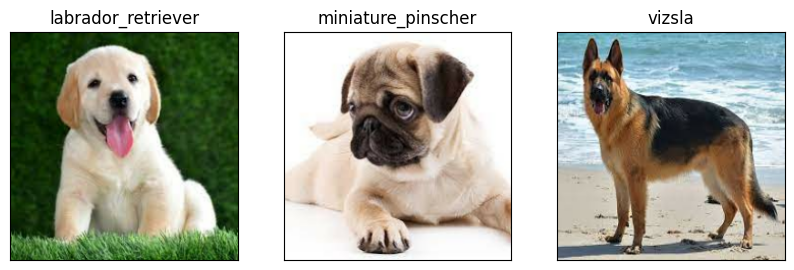

In [ ]:
# Custom custom images predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image.astype('uint8'))